# Project 3 - Applying CNN
Myli Brown and Ethan Stout

## Imports and Setup

In [13]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import pathlib

device = torch.device("cpu")

## The Data

### Load and Display the Data

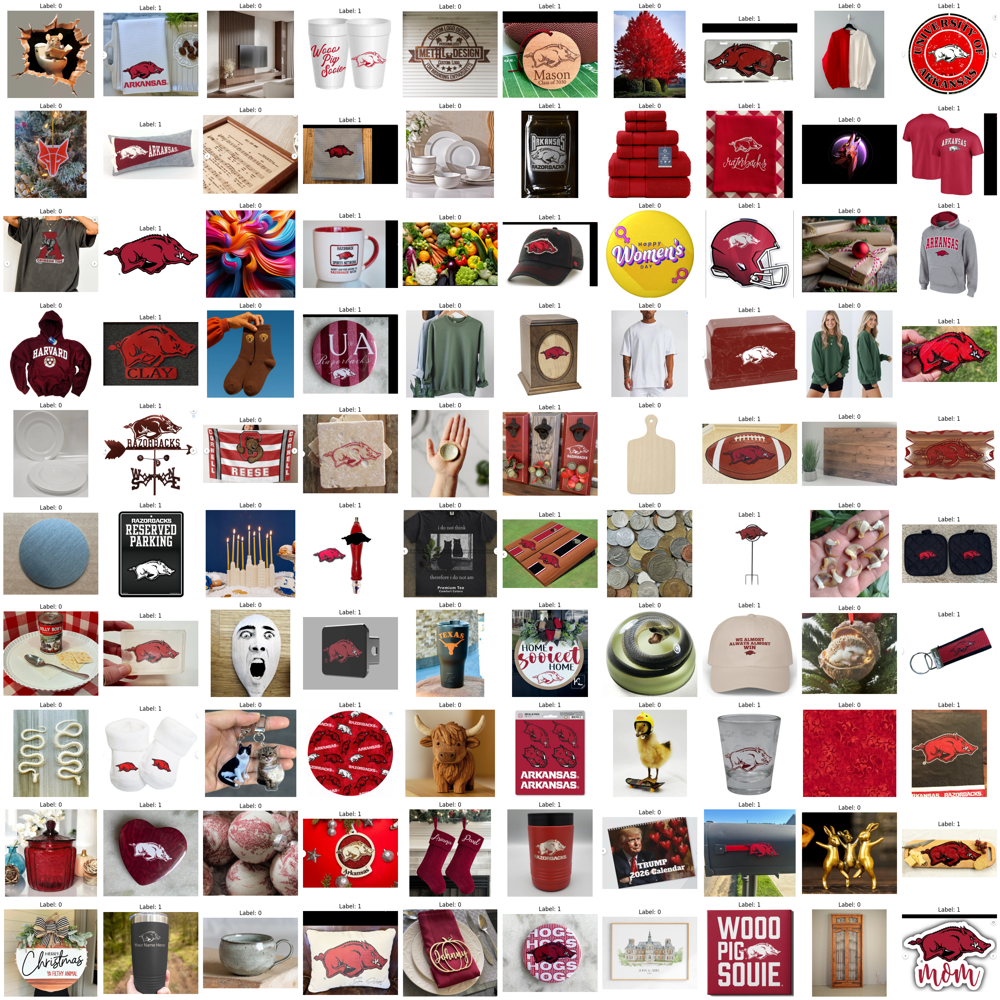

In [14]:
# Dataset Class
class ImageDataset(Dataset):
    def __init__(self, files, labels, transform):
        self.files, self.labels, self.transform = files, labels, transform
    
    def __len__(self): 
        return len(self.labels)
    
    def __getitem__(self, i):
        img = Image.open(self.files[i]).convert("RGB")
        return self.transform(img), torch.tensor(self.labels[i], dtype=torch.float32)


# Load Data
img_dir = pathlib.Path(r"C:/Users/roami/OneDrive/Desktop/Fall 2025/Honors Machine Learning/Code/Project_3/Project_3_Images")
files = sorted([str(p) for p in img_dir.glob("*.png")])
labels = [1 if "Razorback" in os.path.basename(f) else 0 for f in files]


# Preview images with labels
n_preview = len(files)
cols = 10
rows = (n_preview + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(3*cols, 3*rows))
axes = axes.flatten()

for i in range(n_preview):
    img = Image.open(files[i]).convert("RGB")
    label = labels[i]
    axes[i].imshow(img)
    axes[i].set_title(f"Label: {label}")
    axes[i].axis("off")

for j in range(n_preview, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

### Set Transformations for the Data

In [16]:
train_tf = transforms.Compose([
    transforms.Resize((500, 500)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])
eval_tf = transforms.Compose([
    transforms.Resize((500, 500)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])


### Create Train, Validation, Test Datasets With Transformations

## The Model

In [ ]:
# Set fixed random seed for reproducibility
seed = 1
g = torch.Generator().manual_seed(seed)

# deterministic dataset splits
n = len(files)
train_n, val_n = int(0.7 * n), int(0.15 * n)

full_ds = ImageDataset(files, labels, train_tf)

train_ds, val_ds, test_ds = random_split(
    full_ds,
    [train_n, val_n, n - train_n - val_n],
    generator=g        # deterministic split
)

# deterministic transforms for val and test
val_ds.dataset.transform = eval_tf
test_ds.dataset.transform = eval_tf

# deterministic data loaders
train_dl = DataLoader(
    train_ds,
    batch_size=8,
    shuffle=True,          # shuffling OK because generator is fixed
    num_workers=0,         # REQUIRED for determinism
    generator=g            # deterministic shuffling order
)

val_dl = DataLoader(
    val_ds,
    batch_size=8,
    shuffle=False,
    num_workers=0,
    generator=g            # ensures deterministic iteration
)

test_dl = DataLoader(
    test_ds,
    batch_size=8,
    shuffle=False,
    num_workers=0,
    generator=g
)


### Training

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
import os
from torchvision import models


# Global deterministic settings
seed = 333

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

os.environ["PYTHONHASHSEED"] = str(seed)

# Force deterministic algorithms
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# Model: Resnet18 (fully deterministic)
model = models.resnet18(weights="IMAGENET1K_V1")

# Freeze early layers
for layer in [model.conv1, model.bn1, model.layer1, model.layer2, model.layer3]:
    layer.requires_grad_(False)

# deterministic linear layer.
model.fc = nn.Linear(512, 1)

model = model.to(device)


# Deterministic loss and optimizer
loss_fn = nn.BCEWithLogitsLoss()

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4,
    weight_decay=1e-2
)


# Deterministic training loop
best_loss, patience = float("inf"), 0

history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

print(f"Epoch #  | Train: Loss / Accuracy | Val: Loss / Accuracy")

for epoch in range(30):

    # Training phase
    model.train()    # Safe: dropout removed, so no randomness
    t_loss, t_correct, t_total = 0, 0, 0

    for x, y in train_dl:
        x, y = x.to(device), y.to(device)

        optimizer.zero_grad()

        logits = model(x).squeeze(1)

        loss = loss_fn(logits, y)
        loss.backward()
        optimizer.step()

        # Metrics
        t_loss += loss.item() * len(y)
        t_correct += ((torch.sigmoid(logits) >= 0.5) == y).sum().item()
        t_total += len(y)

    # Validation phase
    model.eval()
    v_loss, v_correct, v_total = 0, 0, 0

    with torch.no_grad():
        for x, y in val_dl:
            x, y = x.to(device), y.to(device)

            logits = model(x).squeeze(1)

            v_loss += loss_fn(logits, y).item() * len(y)
            v_correct += ((torch.sigmoid(logits) >= 0.5) == y).sum().item()
            v_total += len(y)

    # Logging loss and accuracy
    tl, ta = t_loss/t_total, t_correct/t_total
    vl, va = v_loss/v_total, v_correct/v_total

    history["train_loss"].append(tl)
    history["val_loss"].append(vl)
    history["train_acc"].append(ta)
    history["val_acc"].append(va)

    print(f"Epoch {epoch+1:02d} | Train: {tl:.4f} / {ta:.2%} | Val: {vl:.4f} / {va:.2%}")

    # Early stopping procedure
    if vl < best_loss:
        best_loss = vl
        patience = 0
        torch.save(model.state_dict(), "Group_7_CNN_FullModel.ph")
    else:
        patience += 1
        if patience >= 7:
            print("Early stopping")
            break


Epoch #  | Train: Loss / Accuracy | Val: Loss / Accuracy
Epoch 01 | Train: 0.5728 / 71.43% | Val: 0.5343 / 73.33%
Epoch 02 | Train: 0.1952 / 97.14% | Val: 0.5603 / 73.33%
Epoch 03 | Train: 0.1104 / 98.57% | Val: 0.5410 / 80.00%
Epoch 04 | Train: 0.1042 / 98.57% | Val: 0.6061 / 73.33%
Epoch 05 | Train: 0.0654 / 98.57% | Val: 0.5080 / 86.67%
Epoch 06 | Train: 0.1376 / 94.29% | Val: 0.5182 / 86.67%
Epoch 07 | Train: 0.0429 / 100.00% | Val: 0.5449 / 73.33%
Epoch 08 | Train: 0.0484 / 100.00% | Val: 0.5838 / 66.67%
Epoch 09 | Train: 0.0411 / 100.00% | Val: 0.5422 / 66.67%
Epoch 10 | Train: 0.0170 / 100.00% | Val: 0.5212 / 73.33%
Epoch 11 | Train: 0.0077 / 100.00% | Val: 0.5231 / 80.00%
Epoch 12 | Train: 0.0061 / 100.00% | Val: 0.5389 / 80.00%
Early stopping


### Testing and Plotting Test Results

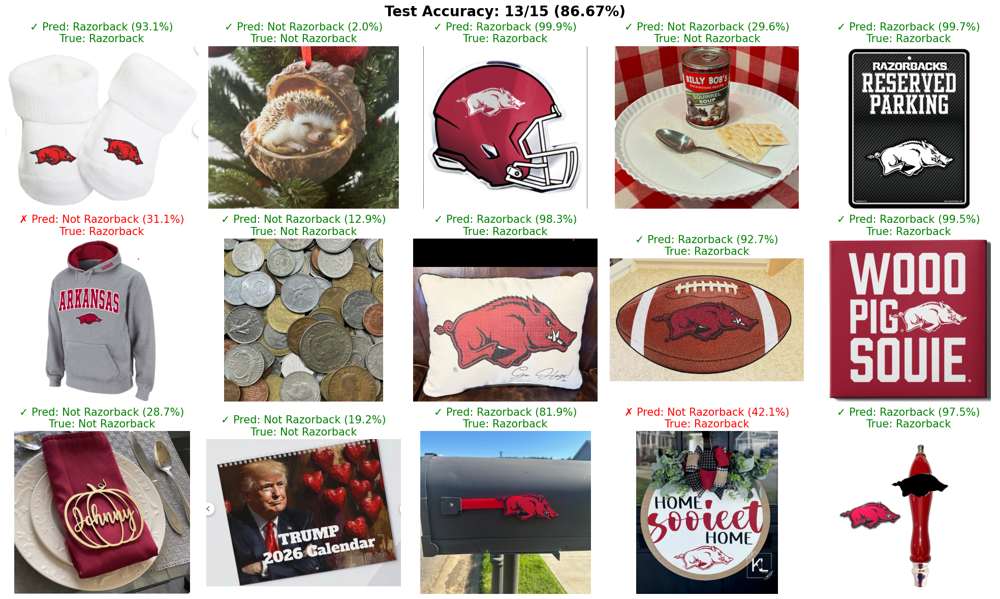

In [19]:
# Test - Plot each image with predictions
model.load_state_dict(torch.load("Group_7_CNN_FullModel.ph"))
model.eval()

test_indices = test_ds.indices
n_test = len(test_indices)

# Create grid of images
cols = min(5, n_test)
rows = (n_test + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
axes = axes.flatten() if n_test > 1 else [axes]

correct = 0
with torch.no_grad():
    for i, idx in enumerate(test_indices):
        img_path = files[idx]
        true_label = labels[idx]
        
        # Load and predict
        img = Image.open(img_path).convert("RGB")
        x = eval_tf(img).unsqueeze(0).to(device)
        prob = torch.sigmoid(model(x).squeeze()).item()
        pred_label = 1 if prob >= 0.5 else 0
        
        is_correct = pred_label == true_label
        correct += is_correct
        
        true_name = "Razorback" if true_label == 1 else "Not Razorback"
        pred_name = "Razorback" if pred_label == 1 else "Not Razorback"
        status = "✓" if is_correct else "✗"
        color = "green" if is_correct else "red"
        
        # Plot
        axes[i].imshow(img)
        axes[i].set_title(f"{status} Pred: {pred_name} ({prob:.1%})\nTrue: {true_name}", 
                         color=color, fontsize=15)
        axes[i].axis("off")

# Hide empty subplots
for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.suptitle(f"Test Accuracy: {correct}/{n_test} ({correct/n_test:.2%})", fontsize=20, fontweight="bold")
plt.tight_layout()
plt.show()

### Plotting Loss and Accuracy

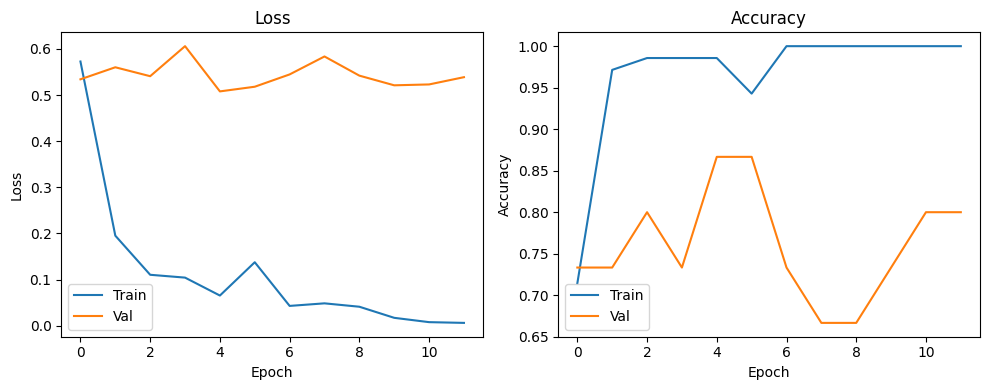

In [20]:
# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.plot(history["train_loss"], label="Train")
ax1.plot(history["val_loss"], label="Val")
ax1.set_xlabel("Epoch"); ax1.set_ylabel("Loss"); ax1.legend(); ax1.set_title("Loss")

ax2.plot(history["train_acc"], label="Train")
ax2.plot(history["val_acc"], label="Val")
ax2.set_xlabel("Epoch"); ax2.set_ylabel("Accuracy"); ax2.legend(); ax2.set_title("Accuracy")
plt.tight_layout()
plt.show()